In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import os
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score
from torchvision import datasets, transforms, models
import os
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# =============================
# CONFIG
# =============================
TEST_DIR   = "/data/vision/beery/scratch/serena/Bjerge_dataset/random_test"
# MODELS_DIR = "/data/vision/beery/scratch/serena/0424/dreambooth_cfg_3_7_bjerge_f1"
# MODELS_DIR = "/data/vision/beery/scratch/serena/0424/baseline_random_bjerge_val_f1"
MODELS_DIR = "/data/vision/beery/scratch/serena/0424/baseline_simone_new"
SAVE_DIR =  MODELS_DIR
NUM_CLASSES = 9
BATCH_SIZE  = 32

# =============================
# DEVICE
# =============================
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}\n")

# =============================
# TRANSFORM
# =============================
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

# =============================
# DATASET
# =============================
test_dataset = datasets.ImageFolder(TEST_DIR, transform=test_transform)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=2)

# =============================
# EVALUATE EACH MODEL
# =============================
model_files = sorted(f for f in os.listdir(MODELS_DIR) if f.endswith(".pth"))
assert len(model_files) > 0, f"No .pth files found in {MODELS_DIR}"

results = {"precision": [], "recall": [], "f1": []}
class_names = test_dataset.classes

# Initialize an empty matrix to accumulate raw counts
total_cm = np.zeros((NUM_CLASSES, NUM_CLASSES))

def plot_and_save_cm(cm, title, save_path, class_names):
    """
    Normalizes the input CM and plots it.
    cm: raw count matrix
    """
    # Normalize by row (True Labels). Each row sums to 1.0.
    # We add a tiny epsilon to avoid division by zero if a class has no samples
    cm_normalized = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-9)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm_normalized,
        annot=True,
        fmt='.2f',
        cmap='Blues',
        vmin=0.0,            # ✅ force lower bound
        vmax=1.0,            # ✅ force upper bound
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.title(title)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

for model_file in model_files:
    model_path = os.path.join(MODELS_DIR, model_file)
    print(f"Evaluating: {model_file}")

    checkpoint = torch.load(model_path, map_location=DEVICE)
    state_dict = checkpoint["model_state_dict"] if "model_state_dict" in checkpoint else checkpoint

    model = models.resnet18(weights=None)
    model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
    model.load_state_dict(state_dict)
    model.to(DEVICE)
    model.eval()

    all_preds, all_labels = [], []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            _, preds = torch.max(model(inputs), 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate individual CM and add to total
    current_cm = confusion_matrix(all_labels, all_preds, labels=range(NUM_CLASSES))
    total_cm += current_cm

    # Standard metrics
    p = precision_score(all_labels, all_preds, average="macro", zero_division=0)
    r = recall_score(all_labels, all_preds, average="macro", zero_division=0)
    f = f1_score(all_labels, all_preds, average="macro", zero_division=0)

    results["precision"].append(p)
    results["recall"].append(r)
    results["f1"].append(f)
    print(f"  F1: {f*100:.2f}%")

# =============================
# FINAL AGGREGATION & CM PLOT
# =============================

# Save the Averaged/Combined Confusion Matrix
avg_cm_path = os.path.join(SAVE_DIR, "averaged_confusion_matrix.png")
plot_and_save_cm(total_cm, f"Averaged Normalized CM ({len(model_files)} runs)", 
                 avg_cm_path, class_names)

print(f"\n✅ Averaged confusion matrix saved to: {avg_cm_path}")

print("\n" + "="*45)
print(f"AGGREGATE RESULTS ({len(model_files)} models)")
print("="*45)
for metric, values in results.items():
    m = np.mean(values) * 100
    s = np.std(values) * 100
    print(f"{metric.capitalize():<10} | Mean: {m:6.2f}%  Std: {s:6.2f}%")
print("="*45)

import pandas as pd
# =============================
# SAVE PER-MODEL METRICS CSV
# =============================
metrics_df = pd.DataFrame({
    "run": list(range(len(model_files))),
    "model": model_files,
    "precision": results["precision"],
    "recall": results["recall"],
    "f1": results["f1"],
})

metrics_csv_path = os.path.join(SAVE_DIR, "per_model_metrics.csv")
metrics_df.to_csv(metrics_csv_path, index=False)

print(f"\n✅ Per-model metrics saved to: {metrics_csv_path}")

# =============================
# SAVE AGGREGATE METRICS CSV
# =============================
aggregate_data = []

for metric, values in results.items():
    mean_val = np.mean(values)
    std_val  = np.std(values)
    
    aggregate_data.append({
        "metric": metric,
        "mean": mean_val,
        "std": std_val
    })

aggregate_df = pd.DataFrame(aggregate_data)

aggregate_csv_path = os.path.join(SAVE_DIR, "aggregate_metrics.csv")
aggregate_df.to_csv(aggregate_csv_path, index=False)

print(f"\n✅ Aggregate metrics saved to: {aggregate_csv_path}")

Using device: cuda

Evaluating: best_model_run1.pth
  F1: 42.84%
Evaluating: best_model_run2.pth
  F1: 53.83%
Evaluating: best_model_run3.pth
  F1: 56.34%
Evaluating: best_model_run4.pth
  F1: 54.77%
Evaluating: best_model_run5.pth
  F1: 55.07%

✅ Averaged confusion matrix saved to: /data/vision/beery/scratch/serena/0424/baseline_simone_new/averaged_confusion_matrix.png

AGGREGATE RESULTS (5 models)
Precision  | Mean:  53.95%  Std:   2.62%
Recall     | Mean:  61.05%  Std:   6.33%
F1         | Mean:  52.57%  Std:   4.93%

✅ Per-model metrics saved to: /data/vision/beery/scratch/serena/0424/baseline_simone_new/per_model_metrics.csv

✅ Aggregate metrics saved to: /data/vision/beery/scratch/serena/0424/baseline_simone_new/aggregate_metrics.csv


## Save per model f1 for all models

In [2]:
import os
import torch
import torch.nn as nn
import numpy as np
import pandas as pd

from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
from sklearn.metrics import precision_score, recall_score, f1_score

# =============================
# CONFIG
# =============================
TEST_DIR = "/data/vision/beery/scratch/serena/Bjerge_dataset/random_test"
ROOT_DIR = "/data/vision/beery/scratch/serena/0424"
NUM_CLASSES = 9
BATCH_SIZE = 32

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}\n")

# =============================
# TRANSFORM / DATA
# =============================
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

test_dataset = datasets.ImageFolder(TEST_DIR, transform=test_transform)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=2)

print(f"Loaded test set with {len(test_dataset)} images\n")

# =============================
# MODEL FOLDERS
# =============================
model_dirs = sorted([
    d for d in os.listdir(ROOT_DIR)
    if os.path.isdir(os.path.join(ROOT_DIR, d))
])

assert len(model_dirs) > 0

# =============================
# MAIN LOOP
# =============================
for model_name in model_dirs:

    model_dir = os.path.join(ROOT_DIR, model_name)
    eval_csv_path = os.path.join(model_dir, "model_eval.csv")

    if os.path.exists(eval_csv_path):
        print(f"⏭️ Skipping {model_name} (already evaluated)")
        continue

    run_files = sorted([
        f for f in os.listdir(model_dir)
        if f.endswith(".pth")
    ])

    if len(run_files) == 0:
        print(f"⚠️ Skipping {model_name} (no checkpoints)")
        continue

    print(f"\n=== Evaluating {model_name} ({len(run_files)} runs) ===")

    model_results = []

    # =============================
    # RUNS
    # =============================
    for run_idx, model_file in enumerate(run_files):

        model_path = os.path.join(model_dir, model_file)

        checkpoint = torch.load(model_path, map_location=DEVICE)
        state_dict = checkpoint["model_state_dict"] if "model_state_dict" in checkpoint else checkpoint

        model = models.resnet18(weights=None)
        model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
        model.load_state_dict(state_dict)
        model.to(DEVICE)
        model.eval()

        all_preds, all_labels = [], []

        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs = inputs.to(DEVICE)
                labels = labels.to(DEVICE)

                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)

                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        # =============================
        # METRICS
        # =============================
        p = precision_score(all_labels, all_preds, average="macro", zero_division=0)
        r = recall_score(all_labels, all_preds, average="macro", zero_division=0)
        f = f1_score(all_labels, all_preds, average="macro", zero_division=0)

        model_results.append({
            "run": run_idx,
            "checkpoint": model_file,
            "precision": p,
            "recall": r,
            "f1": f
        })

        print(f"  Run {run_idx}: F1 = {f*100:.2f}%")

    # =============================
    # SAVE PER-MODEL CSV
    # =============================
    df_model = pd.DataFrame(model_results)

    save_path = os.path.join(model_dir, "model_eval.csv")
    df_model.to_csv(save_path, index=False)

    print(f"✅ Saved: {save_path}")

# =============================
print("\nDone all models.")

Using device: cuda

Loaded test set with 24557 images

⏭️ Skipping Siblings_Augmentation_0_Flux (already evaluated)
⏭️ Skipping Siblings_Augmentation_0_Qwen (already evaluated)
⏭️ Skipping Siblings_Augmentation_0_dreambooth_3_5_fixed (already evaluated)
⏭️ Skipping Siblings_Augmentation_0_dreambooth_3_7_fixed (already evaluated)
⏭️ Skipping Siblings_Augmentation_1000_Flux (already evaluated)
⏭️ Skipping Siblings_Augmentation_1000_Qwen (already evaluated)
⏭️ Skipping Siblings_Augmentation_1000_dreambooth_3_5_fixed (already evaluated)
⏭️ Skipping Siblings_Augmentation_1000_dreambooth_3_7_fixed (already evaluated)
⏭️ Skipping Siblings_Augmentation_100_Flux (already evaluated)
⏭️ Skipping Siblings_Augmentation_100_Qwen (already evaluated)
⏭️ Skipping Siblings_Augmentation_100_dreambooth_3_5_fixed (already evaluated)
⏭️ Skipping Siblings_Augmentation_100_dreambooth_3_7_fixed (already evaluated)
⏭️ Skipping Siblings_Augmentation_200_Flux (already evaluated)
⏭️ Skipping Siblings_Augmentation_

# POSTER FIGURES

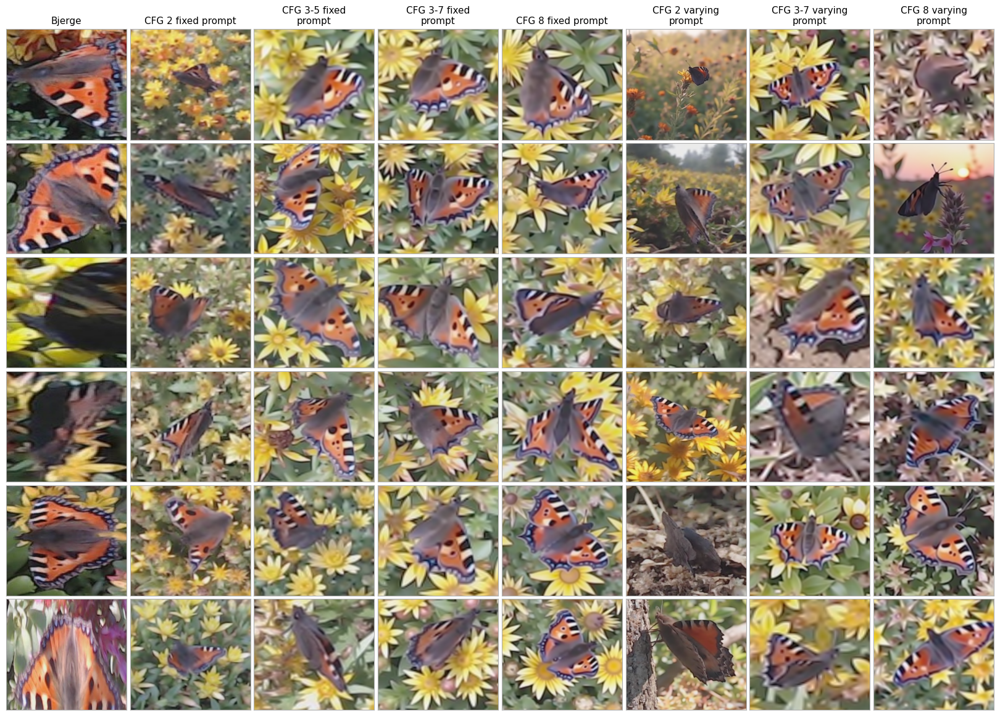

In [5]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import textwrap

# ----------------------------
# helpers
# ----------------------------
def get_image_paths(folder):
    return sorted([
        os.path.join(folder, f)
        for f in os.listdir(folder)
        if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.webp'))
    ])

def get_class_folder(root, class_name):
    path = os.path.join(root, class_name)
    return path if os.path.isdir(path) else None

def load_image(path):
    return Image.open(path).convert("RGB")

def wrap_text(text, width=14):
    return "\n".join(textwrap.wrap(text, width=width))

import random
# ----------------------------
# main function
# ----------------------------
def visualize_class_across_folders(
    roots,
    column_labels,
    class_name,
    num_rows=5,
    wrap_width=14
):
    """
    roots: list of dataset folders
    column_labels: list of labels for each column (same length as roots)
    class_name: subfolder/class to visualize
    num_rows: number of image samples per column
    """

    assert len(roots) == len(column_labels), "roots and column_labels must match"

    all_images = []

    for root in roots:
        class_folder = get_class_folder(root, class_name)

        if class_folder is None:
            imgs = []
        else:
            imgs = get_image_paths(class_folder)

        # 🔽 REPLACE THIS LINE
        # all_images.append(imgs[:num_rows])

        # 🔽 WITH THIS
        if len(imgs) >= num_rows:
            sampled = random.sample(imgs, num_rows)
        else:
            sampled = imgs

        all_images.append(sampled)

    n_cols = len(roots)

    # ----------------------------
    # figure (compact layout)
    # ----------------------------
    fig, axes = plt.subplots(
        num_rows,
        n_cols,
        figsize=(2 * n_cols, 2 * num_rows),
        gridspec_kw={'wspace': 0.03, 'hspace': 0.03}
    )

    if num_rows == 1:
        axes = [axes]

    # ----------------------------
    # fill grid
    # ----------------------------
    for col in range(n_cols):
        imgs = all_images[col]

        for row in range(num_rows):
            ax = axes[row][col]

            if row < len(imgs):
                img = load_image(imgs[row])
                ax.imshow(img, aspect='auto')
            else:
                ax.axis('off')

            ax.set_xticks([])
            ax.set_yticks([])
            for spine in ax.spines.values():
                spine.set_visible(True)
                spine.set_edgecolor('#B0B0B0')  # light gray border
                spine.set_linewidth(0.8)

            # ----------------------------
            # COLUMN LABELS (TOP ONLY)
            # ----------------------------
            if row == 0:
                ax.set_title(
                    wrap_text(column_labels[col], wrap_width),
                    fontsize=11,
                    pad=6
                )

    plt.subplots_adjust(left=0, right=1, top=0.92, bottom=0)
    plt.show()


# ----------------------------
# EXAMPLE USAGE
# ----------------------------
roots = [
    "/data/vision/beery/scratch/serena/Bjerge_dataset/original",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_2_fixed",
    "/data/vision/beery/scratch/serena/diffusion/dreambooth_full",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_3_7_fixed",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_8_fixed",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_2_vary_prompt",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_3_7_vary_prompt",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_8_vary_prompt"
]

labels = [
    "Bjerge",
    "CFG 2 fixed prompt",
    "CFG 3-5 fixed prompt",
    "CFG 3-7 fixed prompt",
    "CFG 8 fixed prompt",
    "CFG 2 varying prompt",
    "CFG 3-7 varying prompt",
    "CFG 8 varying prompt"
]

visualize_class_across_folders(
    roots=roots,
    column_labels=labels,
    class_name="Aglais urticae",
    num_rows=6,
    wrap_width=18
)

## Paired t-test (flux vs. qwen)

In [12]:
import os
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind

# =============================
# CONFIG
# =============================
ROOT = "/data/vision/beery/scratch/serena/0424"

MODEL_A_KEY = "Flux"
MODEL_B_KEY = "Qwen"

SIZES = list(range(100, 1001, 100))
CSV_NAME = "model_eval.csv"

# =============================
# LOAD ALL F1 SCORES
# =============================
def load_model_f1(key):
    f1_scores = []

    for size in SIZES:
        matching_folders = [
            f for f in os.listdir(ROOT)
            if f"Siblings_Augmentation_{size}" in f
            and key.lower() in f.lower()
        ]

        for folder_name in matching_folders:
            csv_path = os.path.join(ROOT, folder_name, CSV_NAME)

            if not os.path.exists(csv_path):
                continue

            df = pd.read_csv(csv_path)

            # collect ALL runs (no averaging)
            f1_scores.extend(df["f1"].values)

    if len(f1_scores) == 0:
        raise ValueError(f"No data found for {key}")

    return np.array(f1_scores)


f1_a = load_model_f1(MODEL_A_KEY)
f1_b = load_model_f1(MODEL_B_KEY)

# =============================
print("\n=== PER-SIZE COMPARISON ===\n")

for size in SIZES:
    f1_a_size = []
    f1_b_size = []

    for folder in os.listdir(ROOT):
        if f"Siblings_Augmentation_{size}" not in folder:
            continue

        csv_path = os.path.join(ROOT, folder, CSV_NAME)
        if not os.path.exists(csv_path):
            continue

        df = pd.read_csv(csv_path)

        if MODEL_A_KEY.lower() in folder.lower():
            f1_a_size.extend(df["f1"].values)

        elif MODEL_B_KEY.lower() in folder.lower():
            f1_b_size.extend(df["f1"].values)

    if len(f1_a_size) == 0 or len(f1_b_size) == 0:
        print(f"Size {size}: ⚠️ missing data")
        continue

    f1_a_size = np.array(f1_a_size)
    f1_b_size = np.array(f1_b_size)

    t, p = ttest_ind(f1_a_size, f1_b_size, equal_var=False)

    print(f"Size {size:4d} | "
          f"Qwen Edit: {f1_a_size.mean():.3f} | "
          f"Flux: {f1_b_size.mean():.3f} | "
          f"Δ={(f1_b_size.mean()-f1_a_size.mean()):+.3f}")


=== PER-SIZE COMPARISON ===

Size  100 | Qwen Edit: 0.590 | Flux: 0.566 | Δ=-0.025
Size  200 | Qwen Edit: 0.471 | Flux: 0.589 | Δ=+0.118
Size  300 | Qwen Edit: 0.604 | Flux: 0.568 | Δ=-0.036
Size  400 | Qwen Edit: 0.588 | Flux: 0.539 | Δ=-0.049
Size  500 | Qwen Edit: 0.504 | Flux: 0.586 | Δ=+0.081
Size  600 | Qwen Edit: 0.560 | Flux: 0.550 | Δ=-0.010
Size  700 | Qwen Edit: 0.550 | Flux: 0.596 | Δ=+0.046
Size  800 | Qwen Edit: 0.616 | Flux: 0.584 | Δ=-0.032
Size  900 | Qwen Edit: 0.532 | Flux: 0.521 | Δ=-0.011
Size 1000 | Qwen Edit: 0.573 | Flux: 0.570 | Δ=-0.004


## Paired t-test (dreambooth vs. baseline)

In [8]:
import os
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind

# =============================
# CONFIG
# =============================
ROOT = "/data/vision/beery/scratch/serena/0424"

BASELINE_PATH = os.path.join(
    ROOT,
    "Siblings_Augmentation_0_dreambooth_3_5_fixed",
    "model_eval.csv"
)

DREAMBOOTH_KEY = "dreambooth_3_5_fixed"
SIZES = list(range(100, 1001, 100))
CSV_NAME = "model_eval.csv"

# =============================
# LOAD BASELINE
# =============================
df_base = pd.read_csv(BASELINE_PATH)

if "f1" not in df_base.columns:
    raise ValueError("Baseline CSV missing 'f1'")

f1_base = df_base["f1"].values

print(f"Baseline: {np.mean(f1_base):.4f} ± {np.std(f1_base):.4f} (n={len(f1_base)})\n")

# =============================
# PER-SIZE COMPARISON
# =============================
print("=== PER-AUGMENTATION COMPARISON ===\n")

for size in SIZES:

    f1_db = []

    matching_folders = [
        f for f in os.listdir(ROOT)
        if f"Siblings_Augmentation_{size}" in f
        and DREAMBOOTH_KEY in f
    ]

    for folder_name in matching_folders:
        csv_path = os.path.join(ROOT, folder_name, CSV_NAME)

        if not os.path.exists(csv_path):
            continue

        df = pd.read_csv(csv_path)

        if "f1" not in df.columns:
            continue

        f1_db.extend(df["f1"].values)

    if len(f1_db) == 0:
        print(f"Size {size}: ⚠️ no data")
        continue

    f1_db = np.array(f1_db)

    # Welch’s t-test
    t_stat, p_value = ttest_ind(f1_db, f1_base, equal_var=False)

    gain = np.mean(f1_db) - np.mean(f1_base)

    print(f"Size {size:4d} | "
          f"DB: {np.mean(f1_db):.3f}±{np.std(f1_db):.3f} (n={len(f1_db)}) | "
          f"Gain: {gain:+.3f} | "
          f"p={p_value:.4f} "
          f"{'✅' if p_value < 0.05 else '❌'}")

Baseline: 0.5936 ± 0.0499 (n=5)

=== PER-AUGMENTATION COMPARISON ===

Size  100 | DB: 0.619±0.053 (n=10) | Gain: +0.025 | p=0.4367 ❌
Size  200 | DB: 0.620±0.057 (n=5) | Gain: +0.026 | p=0.5129 ❌
Size  300 | DB: 0.628±0.045 (n=5) | Gain: +0.034 | p=0.3425 ❌
Size  400 | DB: 0.582±0.054 (n=5) | Gain: -0.011 | p=0.7673 ❌
Size  500 | DB: 0.590±0.026 (n=5) | Gain: -0.003 | p=0.9050 ❌
Size  600 | DB: 0.621±0.044 (n=5) | Gain: +0.027 | p=0.4419 ❌
Size  700 | DB: 0.616±0.032 (n=5) | Gain: +0.022 | p=0.4727 ❌
Size  800 | DB: 0.630±0.018 (n=5) | Gain: +0.036 | p=0.2276 ❌
Size  900 | DB: 0.567±0.053 (n=5) | Gain: -0.027 | p=0.4810 ❌
Size 1000 | DB: 0.604±0.042 (n=5) | Gain: +0.011 | p=0.7491 ❌


## Baseline with downsizing paired t test

In [3]:
import os
import pandas as pd
import numpy as np
from scipy.stats import ttest_rel, ttest_ind

# =============================
# CONFIG (set your two folders here)
# =============================
ROOT = "/data/vision/beery/scratch/serena/0424"

# baseline downsizing
MODEL_A_PATH = os.path.join(
    ROOT,
    "Siblings_Augmentation_100_dreambooth_3_5_fixed",
    "model_eval.csv"
)

# no downsizing
MODEL_B_PATH = os.path.join(
    ROOT,
    "/data/vision/beery/scratch/serena/0424/baseline_no_downsample_bjerge_val_f1",
    "model_eval.csv"
)

# =============================
# LOAD DATA
# =============================
df_a = pd.read_csv(MODEL_A_PATH)
df_b = pd.read_csv(MODEL_B_PATH)

if "f1" not in df_a.columns or "f1" not in df_b.columns:
    raise ValueError("Both CSVs must contain 'f1' column")

f1_a = df_a["f1"].values
f1_b = df_b["f1"].values

print("=== MODEL COMPARISON ===")
print(f"A: mean={np.mean(f1_a):.4f} ± {np.std(f1_a):.4f} (n={len(f1_a)})")
print(f"B: mean={np.mean(f1_b):.4f} ± {np.std(f1_b):.4f} (n={len(f1_b)})")

# =============================
# TEST CHOICE
# =============================
if len(f1_a) == len(f1_b):
    # assume ordering corresponds (runs aligned)
    t_stat, p_value = ttest_rel(f1_a, f1_b)
    test_name = "Paired t-test"
else:
    # safer default
    t_stat, p_value = ttest_ind(f1_a, f1_b, equal_var=False)
    test_name = "Welch's t-test (unpaired)"

# =============================
# RESULTS
# =============================
print(f"\n=== {test_name} ===")
print(f"t = {t_stat:.4f}")
print(f"p = {p_value:.6f}")

gain = np.mean(f1_b) - np.mean(f1_a)
print(f"Gain (baseline (downsized) - Baseline (no downsizing)): {gain:+.4f}")

if p_value < 0.05:
    print("\n✅ Statistically significant difference")
else:
    print("\n❌ Not statistically significant")

=== MODEL COMPARISON ===
A: mean=0.6329 ± 0.0591 (n=5)
B: mean=0.4397 ± 0.0344 (n=5)

=== Paired t-test ===
t = 12.6029
p = 0.000228
Gain (baseline (downsized) - Baseline (no downsizing)): -0.1932

✅ Statistically significant difference


VISUALIZE GRID

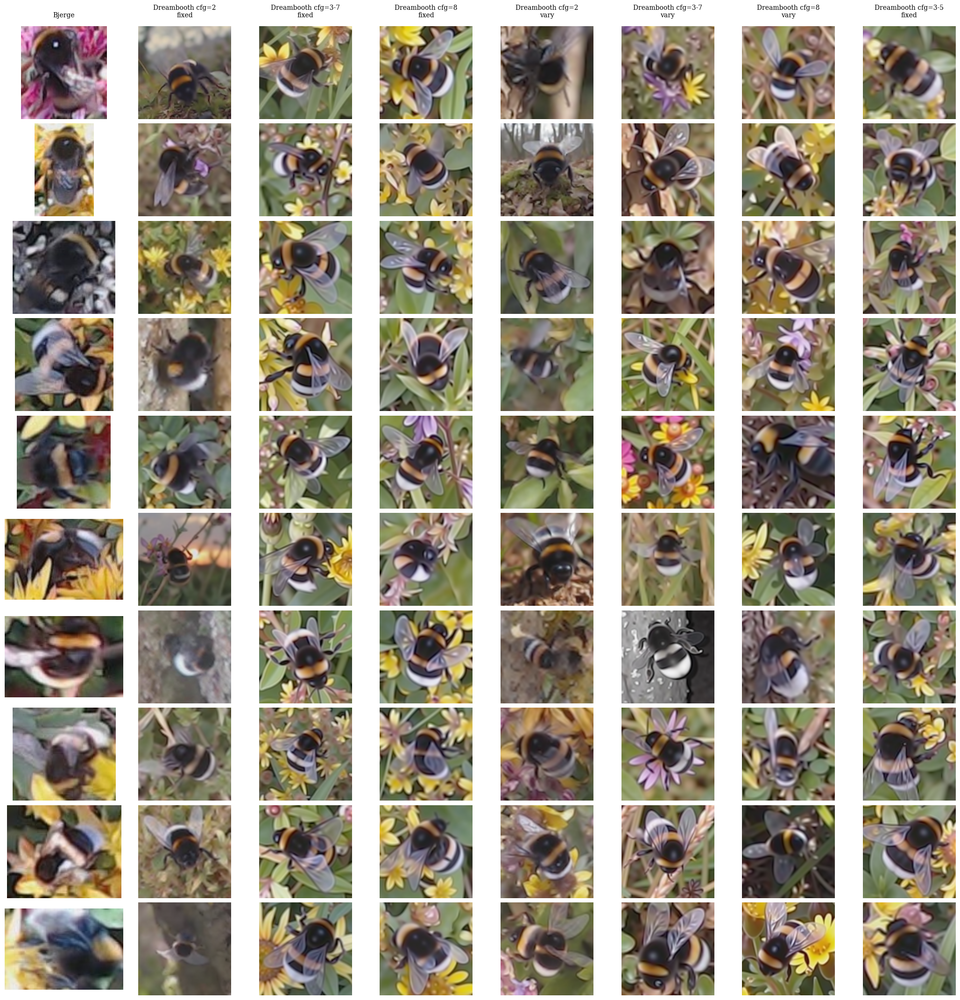

In [9]:
import os
import random
import textwrap
from PIL import Image
import matplotlib.pyplot as plt

IMAGE_EXTS = (".jpg", ".jpeg", ".png", ".webp")

# =============================
# CONFIG
# =============================
FOLDERS = [
    "/data/vision/beery/scratch/serena/Bjerge_dataset/original",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_2_fixed",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_3_7_fixed",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_8_fixed",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_2_vary_prompt",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_3_7_vary_prompt",
    "/data/vision/beery/scratch/serena/dreambooth_new/dreambooth_cfg_8_vary_prompt",
    "/data/vision/beery/scratch/serena/diffusion/dreambooth_full"
]

COLUMN_LABELS = [
    "Bjerge",
    "Dreambooth cfg=2 fixed",
    "Dreambooth cfg=3-7 fixed",
    "Dreambooth cfg=8 fixed",
    "Dreambooth cfg=2 vary",
    "Dreambooth cfg=3-7 vary",
    "Dreambooth cfg=8 vary",
    "Dreambooth cfg=3-5 fixed"
]

SUBFOLDER = "Bombus terrestris"
N_ROWS = 10

assert len(FOLDERS) == len(COLUMN_LABELS), "Labels must match folders"

# =============================
# STYLE
# =============================
plt.rcParams.update({
    "font.family": "serif",
    "font.size": 10
})

# =============================
# HELPERS
# =============================
def get_images(path):
    if not os.path.exists(path):
        return []

    return [
        os.path.join(path, f)
        for f in os.listdir(path)
        if f.lower().endswith(IMAGE_EXTS)
    ]

def sample_images(imgs, k):
    if len(imgs) >= k:
        return random.sample(imgs, k)
    else:
        return random.choices(imgs, k=k) if imgs else [None] * k

def load_image(path):
    try:
        return Image.open(path).convert("RGB")
    except:
        return None

def wrap_label(text, width=18):
    return "\n".join(textwrap.wrap(text, width=width))


# =============================
# PRELOAD IMAGES
# =============================
folder_samples = []

for folder in FOLDERS:
    imgs = get_images(os.path.join(folder, SUBFOLDER))
    sampled = sample_images(imgs, N_ROWS)
    folder_samples.append(sampled)

# =============================
# GRID
# =============================
num_rows = N_ROWS
num_cols = len(FOLDERS)

fig, axes = plt.subplots(
    num_rows,
    num_cols,
    figsize=(3 * num_cols, 2.5 * num_rows)
)

if num_rows == 1:
    axes = [axes]

# =============================
# COLUMN TITLES (use input labels)
# =============================
for j, label in enumerate(COLUMN_LABELS):
    wrapped = wrap_label(label, width=18)

    axes[0][j].set_title(
        wrapped,
        fontsize=10,
        pad=14
    )

# =============================
# FILL GRID
# =============================
for i in range(num_rows):
    for j in range(num_cols):
        ax = axes[i][j]

        img = load_image(folder_samples[j][i])

        if img is not None:
            ax.imshow(img)
        else:
            ax.text(0.5, 0.5, "Missing",
                    ha="center", va="center", fontsize=9)

        ax.axis("off")

        # row labels
        if j == 0:
            ax.set_ylabel(
                f"{SUBFOLDER}\n#{i+1}",
                rotation=0,
                labelpad=40,
                va="center",
                fontsize=9
            )

# =============================
# LAYOUT
# =============================
plt.subplots_adjust(
    wspace=0.02,
    hspace=0.05,
    left=0.12,
    right=0.98,
    top=0.88,
    bottom=0.05
)

plt.show()

## LINE PLOT PER EPOCH

Plot saved successfully as: training_summary.png


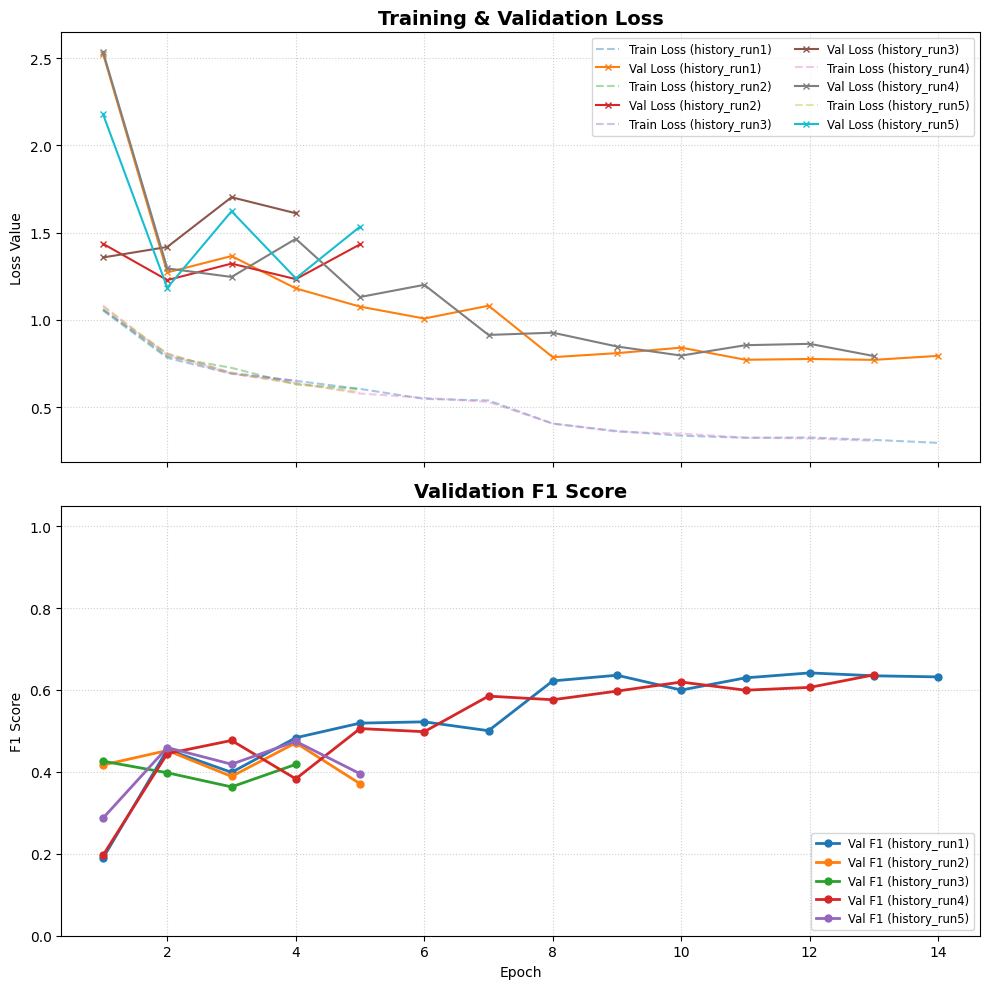

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import os

def plot_essential_metrics(folder_path, output_filename='training_summary.png'):
    # 1. Gather all CSV files
    csv_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.csv')])
    
    if not csv_files:
        print(f"No CSV files found in {folder_path}")
        return

    # Create 2 subplots: one for Loss (Train/Val) and one for Val F1
    fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 10), sharex=True)

    for file_name in csv_files:
        file_path = os.path.join(folder_path, file_name)
        df = pd.read_csv(file_path)
        epochs = range(1, len(df) + 1)
        
        # Use filename as label (removing extension for cleanliness)
        run_id = os.path.splitext(file_name)[0]

        # --- Subplot 1: Loss (Training and Validation) ---
        if 'train_loss' in df.columns and 'val_loss' in df.columns:
            # Training loss as dashed line
            ax1.plot(epochs, df['train_loss'], linestyle='--', alpha=0.4, label=f'Train Loss ({run_id})')
            # Validation loss as solid line with 'x' markers
            ax1.plot(epochs, df['val_loss'], marker='x', markersize=4, label=f'Val Loss ({run_id})')

        # --- Subplot 2: Validation F1 ---
        if 'val_f1' in df.columns:
            ax2.plot(epochs, df['val_f1'], marker='o', markersize=5, linewidth=2, label=f'Val F1 ({run_id})')

    # Formatting Top Plot (Loss)
    ax1.set_title('Training & Validation Loss', fontsize=14, fontweight='bold')
    ax1.set_ylabel('Loss Value')
    ax1.grid(True, linestyle=':', alpha=0.6)
    ax1.legend(loc='upper right', fontsize='small', ncol=2)

    # Formatting Bottom Plot (Val F1)
    ax2.set_title('Validation F1 Score', fontsize=14, fontweight='bold')
    ax2.set_ylabel('F1 Score')
    ax2.set_xlabel('Epoch')
    ax2.set_ylim(0, 1.05) # Keep F1 scale fixed 0-1
    ax2.grid(True, linestyle=':', alpha=0.6)
    ax2.legend(loc='lower right', fontsize='small')

    plt.tight_layout()
    plt.savefig(output_filename, dpi=300)
    print(f"Plot saved successfully as: {output_filename}")

# Example Usage:
plot_essential_metrics('/data/vision/beery/scratch/serena/training_pipeline/baseline_bjerge_val/history')

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import os
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score
from torchvision import datasets, transforms, models
import os
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# =============================
# CONFIG
# =============================
TEST_DIR   = "/data/vision/beery/scratch/serena/Bjerge_dataset/test_cropped"
# MODELS_DIR = "/data/vision/beery/scratch/serena/training_pipeline/baseline"
MODELS_DIR = "/data/vision/beery/scratch/serena/0417/image_quality_qwen_train"
SAVE_DIR =  MODELS_DIR
NUM_CLASSES = 9
BATCH_SIZE  = 32

# =============================
# DEVICE
# =============================
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}\n")

# =============================
# TRANSFORM
# =============================
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

# =============================
# DATASET
# =============================
test_dataset = datasets.ImageFolder(TEST_DIR, transform=test_transform)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=2)

# =============================
# EVALUATE EACH MODEL
# =============================
model_files = sorted(f for f in os.listdir(MODELS_DIR) if f.endswith(".pth"))
assert len(model_files) > 0, f"No .pth files found in {MODELS_DIR}"

results = {"precision": [], "recall": [], "f1": []}
class_names = test_dataset.classes

# Initialize an empty matrix to accumulate raw counts
total_cm = np.zeros((NUM_CLASSES, NUM_CLASSES))

def plot_and_save_cm(cm, title, save_path, class_names):
    """
    Normalizes the input CM and plots it.
    cm: raw count matrix
    """
    # Normalize by row (True Labels). Each row sums to 1.0.
    # We add a tiny epsilon to avoid division by zero if a class has no samples
    cm_normalized = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-9)
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm_normalized,
        annot=True,
        fmt='.2f',
        cmap='Blues',
        vmin=0.0,            # ✅ force lower bound
        vmax=1.0,            # ✅ force upper bound
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.title(title)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

for model_file in model_files:
    model_path = os.path.join(MODELS_DIR, model_file)
    print(f"Evaluating: {model_file}")

    checkpoint = torch.load(model_path, map_location=DEVICE)
    state_dict = checkpoint["model_state_dict"] if "model_state_dict" in checkpoint else checkpoint

    model = models.resnet18(weights=None)
    model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
    model.load_state_dict(state_dict)
    model.to(DEVICE)
    model.eval()

    all_preds, all_labels = [], []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            _, preds = torch.max(model(inputs), 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Calculate individual CM and add to total
    current_cm = confusion_matrix(all_labels, all_preds, labels=range(NUM_CLASSES))
    total_cm += current_cm

    # Standard metrics
    p = precision_score(all_labels, all_preds, average="macro", zero_division=0)
    r = recall_score(all_labels, all_preds, average="macro", zero_division=0)
    f = f1_score(all_labels, all_preds, average="macro", zero_division=0)

    results["precision"].append(p)
    results["recall"].append(r)
    results["f1"].append(f)
    print(f"  F1: {f*100:.2f}%")

# =============================
# FINAL AGGREGATION & CM PLOT
# =============================

# Save the Averaged/Combined Confusion Matrix
avg_cm_path = os.path.join(SAVE_DIR, "averaged_confusion_matrix.png")
plot_and_save_cm(total_cm, f"Averaged Normalized CM ({len(model_files)} runs)", 
                 avg_cm_path, class_names)

print(f"\n✅ Averaged confusion matrix saved to: {avg_cm_path}")

print("\n" + "="*45)
print(f"AGGREGATE RESULTS ({len(model_files)} models)")
print("="*45)
for metric, values in results.items():
    m = np.mean(values) * 100
    s = np.std(values) * 100
    print(f"{metric.capitalize():<10} | Mean: {m:6.2f}%  Std: {s:6.2f}%")
print("="*45)

KeyboardInterrupt: 

In [ ]:

from PIL import Image
import os

FOLDER_PATH = "/data/vision/beery/scratch/serena/GBIF_histogram/train/Apis mellifera"

for filename in sorted(os.listdir(FOLDER_PATH)):
    file_path = os.path.join(FOLDER_PATH, filename)

    try:
        with Image.open(file_path) as img:
            width, height = img.size
            print(f"{filename:30s} | {width} x {height}")
    except:
        # Skip non-image files
        continue

In [2]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import os
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score

# =============================
# CONFIG
# =============================
TEST_DIR   = "/data/vision/beery/scratch/serena/Bjerge_dataset/test_cropped"
# MODELS_DIR = "/data/vision/beery/scratch/serena/insect_analysis/organized/baseline"
MODELS_DIR = "/data/vision/beery/scratch/serena/training_pipeline/baseline"
SAVE_DIR =  MODELS_DIR
NUM_CLASSES = 9
BATCH_SIZE  = 32

# =============================
# DEVICE
# =============================
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}\n")

# =============================
# TRANSFORM
# =============================
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),
])

# =============================
# DATASET
# =============================
test_dataset = datasets.ImageFolder(TEST_DIR, transform=test_transform)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE,
                          shuffle=False, num_workers=2)

# =============================
# EVALUATE EACH MODEL
# =============================
model_files = sorted(f for f in os.listdir(MODELS_DIR) if f.endswith(".pth"))
assert len(model_files) > 0, f"No .pth files found in {MODELS_DIR}"

results = {"precision": [], "recall": [], "f1": []}

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_normalized_cm(all_labels, all_preds, class_names, title, save_path):
    # Compute confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    
    # Normalize by row (True Labels) to get values 0-1
    # Each row sum will be 1.0 (Recall per class)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', vmin=0.0,        
    vmax=1.0, xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Normalized Confusion Matrix: {title}")
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()


for model_file in model_files:
    model_path = os.path.join(MODELS_DIR, model_file)
    print(f"Evaluating: {model_file}")

    checkpoint = torch.load(model_path, map_location=DEVICE)
    state_dict = checkpoint["model_state_dict"] if "model_state_dict" in checkpoint else checkpoint

    model = models.resnet18(weights=None)
    model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
    model.load_state_dict(state_dict)
    model.to(DEVICE)
    model.eval()

    all_preds, all_labels = [], []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            _, preds = torch.max(model(inputs), 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # 2. Plot and save
    class_names = test_dataset.classes
    cm_filename = model_file.replace(".pth", "_cm.png")
    plot_save_path = os.path.join(SAVE_DIR, cm_filename) # Ensure SAVE_DIR is defined
    
    plot_normalized_cm(all_labels, all_preds, class_names, model_file, plot_save_path)
    print(f"  Confusion matrix saved to: {cm_filename}")

    p = precision_score(all_labels, all_preds, average="macro", zero_division=0)
    r = recall_score(all_labels, all_preds, average="macro", zero_division=0)
    f = f1_score(all_labels, all_preds, average="macro", zero_division=0)

    results["precision"].append(p)
    results["recall"].append(r)
    results["f1"].append(f)

    print(f"  Precision: {p*100:.2f}%  Recall: {r*100:.2f}%  F1: {f*100:.2f}%")

# =============================
# AGGREGATE STATS
# =============================
print("\n" + "="*45)
print(f"AGGREGATE RESULTS ({len(model_files)} models)")
print("="*45)
for metric, values in results.items():
    m = np.mean(values) * 100
    s = np.std(values) * 100
    print(f"{metric.capitalize():<10} | Mean: {m:6.2f}%  Std: {s:6.2f}%")
print("="*45)

Using device: cuda

Evaluating: best_model_run1.pth
  Confusion matrix saved to: best_model_run1_cm.png
  Precision: 63.22%  Recall: 71.03%  F1: 64.04%
Evaluating: best_model_run2.pth
  Confusion matrix saved to: best_model_run2_cm.png
  Precision: 62.53%  Recall: 71.72%  F1: 63.48%
Evaluating: best_model_run3.pth
  Confusion matrix saved to: best_model_run3_cm.png
  Precision: 61.26%  Recall: 69.24%  F1: 63.13%
Evaluating: best_model_run4.pth
  Confusion matrix saved to: best_model_run4_cm.png
  Precision: 60.03%  Recall: 67.60%  F1: 60.58%
Evaluating: best_model_run5.pth
  Confusion matrix saved to: best_model_run5_cm.png
  Precision: 64.35%  Recall: 66.81%  F1: 63.21%

AGGREGATE RESULTS (5 models)
Precision  | Mean:  62.28%  Std:   1.51%
Recall     | Mean:  69.28%  Std:   1.90%
F1         | Mean:  62.88%  Std:   1.20%


VISUALIZE LINE PLOT SISTER AUGMENTATIONS

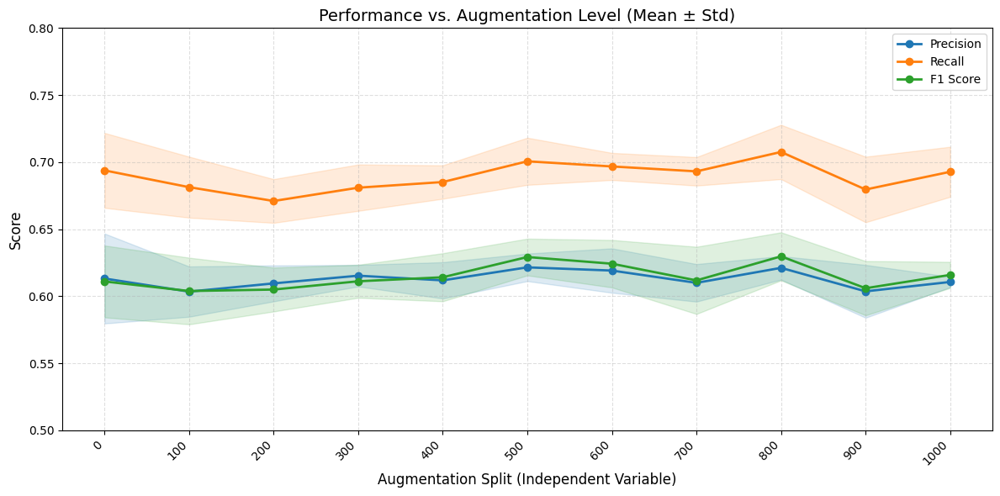

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import re

def plot_macro_metrics(directory_paths):
    # 1. Custom sort to handle numbers correctly (Natural Sort)
    # This prevents the order: 0, 100, 1000, 200...
    def natural_sort_key(s):
        return [int(text) if text.isdigit() else text.lower()
                for text in re.split('([0-9]+)', s)]

    sorted_dirs = sorted(directory_paths, key=natural_sort_key)
    
    results = []

    for directory in sorted_dirs:
        file_path = os.path.join(directory, "model_metrics.csv")
        if not os.path.exists(file_path):
            print(f"Warning: {file_path} not found. Skipping.")
            continue
            
        combined_df = pd.read_csv(file_path)
        
        # FIX: Get the parent folder name (e.g., 'Siblings_Augmentation_100')
        # instead of just the 'metrics' folder name.
        display_name = os.path.basename(os.path.dirname(directory)).split("_")[-1]  # Extract the augmentation level (e.g., '100')
        
        metrics = ['precision_macro', 'recall_macro', 'f1_macro']
        stats = {'directory': display_name}
        
        for m in metrics:
            stats[f'{m}_mean'] = combined_df[m].mean()
            stats[f'{m}_std'] = combined_df[m].std()
            
        results.append(stats)

    plot_df = pd.DataFrame(results)

    # 4. Plotting
    plt.figure(figsize=(12, 6))
    colors = {'precision_macro': '#1f77b4', 'recall_macro': '#ff7f0e', 'f1_macro': '#2ca02c'}
    labels = {'precision_macro': 'Precision', 'recall_macro': 'Recall', 'f1_macro': 'F1 Score'}

    x = plot_df['directory']

    for metric in ['precision_macro', 'recall_macro', 'f1_macro']:
        mean = plot_df[f'{metric}_mean']
        std = plot_df[f'{metric}_std']
        
        plt.plot(x, mean, label=labels[metric], color=colors[metric], marker='o', linewidth=2)
        plt.fill_between(x, mean - std, mean + std, color=colors[metric], alpha=0.15)

    # 5. Styling
    plt.title('Performance vs. Augmentation Level (Mean ± Std)', fontsize=14)
    plt.xlabel('Augmentation Split (Independent Variable)', fontsize=12)
    plt.ylabel('Score', fontsize=12)
    plt.ylim(0.5, 0.8) 
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='best')
    plt.xticks(rotation=45, ha='right')
    
    plt.tight_layout()
    plt.show()

# Your directories list remains the same
directories = ["/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_0/metrics",

"/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_100/metrics",

"/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_200/metrics",

"/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_300/metrics",

"/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_400/metrics",

"/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_500/metrics",

"/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_600/metrics",

"/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_700/metrics",

"/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_800/metrics",

"/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_900/metrics",

"/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_1000/metrics",

]

plot_macro_metrics(directories)

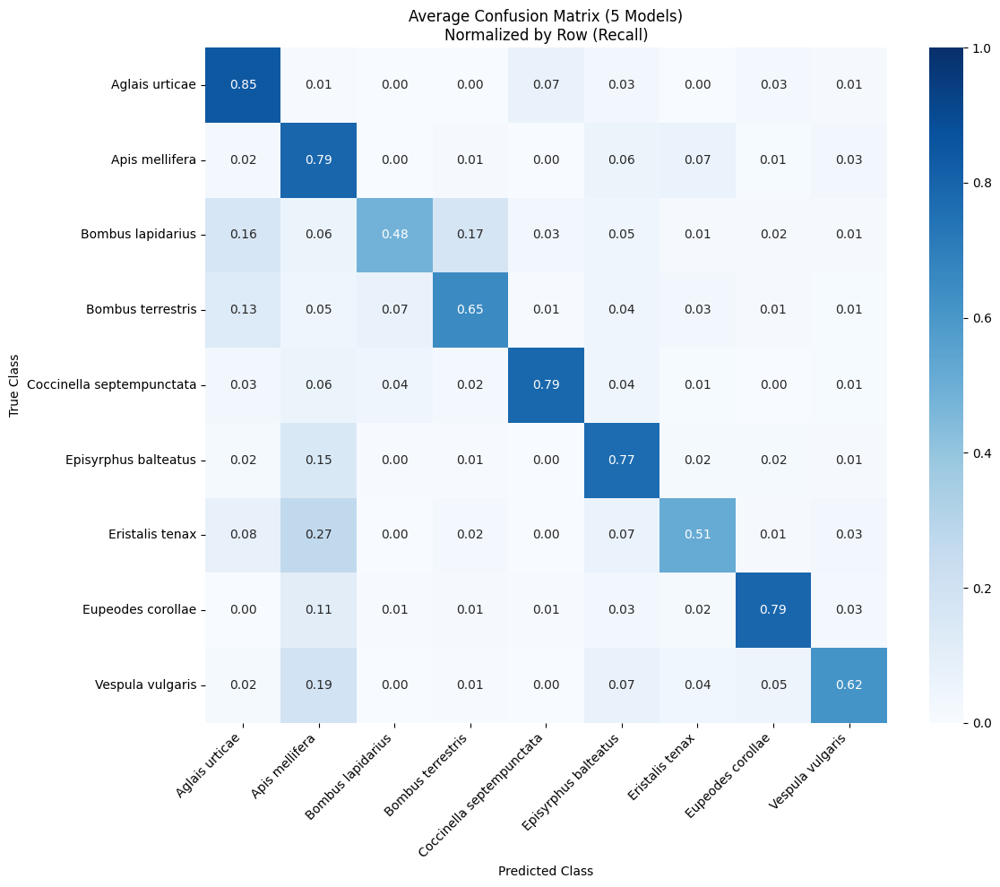

In [ ]:
import json
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

def plot_average_confusion_matrix(file_pattern):
    """
    Loads JSON files matching the pattern, averages their normalized 
    confusion matrices, and plots the result.
    """
    # 1. Find all JSON files (e.g., 'model_*.json')
    json_files = glob.glob(file_pattern)
    
    if not json_files:
        print("No JSON files found matching the pattern.")
        return

    all_model_data = []
    all_classes = set()

    # 2. Load data and identify all unique class names
    for file_path in json_files:
        with open(file_path, 'r') as f:
            data = json.load(f)
            all_model_data.append(data)
            for entry in data:
                all_classes.add(entry['true_class'])
                all_classes.add(entry['predicted_class'])

    # Sort classes alphabetically for a consistent matrix layout
    sorted_classes = sorted(list(all_classes))
    
    # 3. Compute normalized confusion matrices for each model
    normalized_matrices = []
    
    for data in all_model_data:
        y_true = [entry['true_class'] for entry in data]
        y_pred = [entry['predicted_class'] for entry in data]
        
        # 'normalize=true' normalizes over the rows (True labels)
        cm = confusion_matrix(y_true, y_pred, labels=sorted_classes, normalize='true')
        normalized_matrices.append(cm)

    # 4. Calculate the average matrix
    avg_cm = np.mean(normalized_matrices, axis=0)

    # 5. Visualize using Seaborn
    plt.figure(figsize=(12, 10))
    sns.heatmap(
        avg_cm, 
        annot=True,          # Show values in cells
        fmt=".2f",           # Format to 2 decimal places
        cmap="Blues",        # Visual color scheme
        xticklabels=sorted_classes, 
        yticklabels=sorted_classes,
        vmin=0,              # Force scale start at 0
        vmax=1               # Force scale end at 1
    )
    
    plt.title(f"Average Confusion Matrix ({len(json_files)} Models)")
    plt.ylabel('True Class')
    plt.xlabel('Predicted Class')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    
    # Save or show the plot
    plt.savefig('average_confusion_matrix.png', dpi=300)
    plt.show()

# To run the code, provide the path/pattern to your 5 JSON files
plot_average_confusion_matrix("/data/vision/beery/scratch/serena/training_pipeline/Siblings_Augmentation_0/metrics/*.json")

PRINT ALL MODEL EVALUATIONS

In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import os
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# =============================
# CONFIG
# =============================
# BASE_SEARCH_DIR = "/data/vision/beery/scratch/serena/insect_analysis/organized"
BASE_SEARCH_DIR = "/data/vision/beery/scratch/serena/0424"
TEST_DIR        = "/data/vision/beery/scratch/serena/Bjerge_dataset/random_test"
NUM_CLASSES     = 9
BATCH_SIZE      = 32
DEVICE          = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# =============================
# DATASET SETUP
# =============================
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

test_dataset = datasets.ImageFolder(TEST_DIR, transform=test_transform)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
class_names  = test_dataset.classes

def plot_normalized_cm(all_labels, all_preds, class_names, title, save_path):
    cm = confusion_matrix(all_labels, all_preds)
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', vmin=0.0,
    vmax=1.0,xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Normalized CM: {title}")
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.close()

# =============================
# MAIN EVALUATION LOOP
# =============================
subfolders = sorted([f.path for f in os.scandir(BASE_SEARCH_DIR) if f.is_dir()])

print(f"Using device: {DEVICE}")
print(f"Found {len(subfolders)} subfolders to evaluate.\n")

# To store aggregate stats for a final summary
final_summary = []

import pandas as pd

csv_path_clean = os.path.join(BASE_SEARCH_DIR, "evaluation_results_clean.csv")

# =============================
# LOAD EXISTING RESULTS
# =============================
existing_results = {}
final_summary = []

if os.path.exists(csv_path_clean):
    print(f"📄 Found existing results CSV: {csv_path_clean}")
    existing_df = pd.read_csv(csv_path_clean)

    for _, row in existing_df.iterrows():
        name = row["name"]
        existing_results[name] = row.to_dict()
        final_summary.append(row.to_dict())

    print(f"Loaded {len(existing_results)} existing results.\n")
else:
    print("No existing CSV found. Starting fresh.\n")


for folder in subfolders:
    folder_name = os.path.basename(folder)

    # Skip if already computed
    if folder_name in existing_results:
        print(f"⏭️ Skipping {folder_name} (already in CSV)")
        continue
    # Look for the 5 best_model_runX.pth files
    model_files = sorted([f for f in os.listdir(folder) if f.startswith("best_model_run") and f.endswith(".pth")])
    
    if not model_files:
        continue

    print(f"\n📂 Processing Folder: {os.path.basename(folder)}")
    print("-" * 50)
    
    folder_results = {"precision": [], "recall": [], "f1": []}

    for model_file in model_files:
        model_path = os.path.join(folder, model_file)
        
        # Load Model
        checkpoint = torch.load(model_path, map_location=DEVICE)
        state_dict = checkpoint["model_state_dict"] if "model_state_dict" in checkpoint else checkpoint

        model = models.resnet18(weights=None)
        model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
        model.load_state_dict(state_dict)
        model.to(DEVICE)
        model.eval()

        all_preds, all_labels = [], []
        with torch.no_grad():
            for inputs, labels in test_loader:
                inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                all_preds.extend(preds.cpu().numpy())
                all_labels.extend(labels.cpu().numpy())

        # Metrics
        p = precision_score(all_labels, all_preds, average="macro", zero_division=0)
        r = recall_score(all_labels, all_preds, average="macro", zero_division=0)
        f = f1_score(all_labels, all_preds, average="macro", zero_division=0)

        folder_results["precision"].append(p)
        folder_results["recall"].append(r)
        folder_results["f1"].append(f)

        # Optional: Save CM for each run
        cm_path = os.path.join(folder, model_file.replace(".pth", "_test_cm.png"))
        plot_normalized_cm(all_labels, all_preds, class_names, model_file, cm_path)

    # Calculate Mean/Std for this folder
    stats = {}
    for metric, values in folder_results.items():
        stats[f"{metric}_mean"] = np.mean(values) * 100
        stats[f"{metric}_std"] = np.std(values) * 100
    
    stats["name"] = os.path.basename(folder)
    final_summary.append(stats)

    print(f"Finished {len(model_files)} runs.")
    print(f"Mean F1: {stats['f1_mean']:.2f}% (±{stats['f1_std']:.2f}%)")

# =============================
# FINAL TABLE PRINT
# =============================
print("\n" + "="*85)
print(f"{'Subfolder':<30} | {'Prec (Mean±Std)':<18} | {'Rec (Mean±Std)':<18} | {'F1 (Mean±Std)':<18}")
print("="*85)
for s in final_summary:
    p_str = f"{s['precision_mean']:5.2f}±{s['precision_std']:4.2f}"
    r_str = f"{s['recall_mean']:5.2f}±{s['recall_std']:4.2f}"
    f_str = f"{s['f1_mean']:5.2f}±{s['f1_std']:4.2f}"
    print(f"{s['name']:<30} | {p_str:<18} | {r_str:<18} | {f_str:<18}")
print("="*85)

import pandas as pd

# =============================
# SAVE TO CSV
# =============================
# Convert the list of dicts to a DataFrame
results_df = pd.DataFrame(final_summary)

# Reorder columns for readability
cols = ['name', 'precision_mean', 'precision_std', 'recall_mean', 'recall_std', 'f1_mean', 'f1_std']
results_df = results_df[cols]

# 1. Save a "Clean" version for easy parsing/plotting
csv_path_clean = os.path.join(BASE_SEARCH_DIR, "evaluation_results_clean.csv")
results_df.to_csv(csv_path_clean, index=False)

# 2. Save a "Formatted" version (matches your printed table) for reports
results_df_formatted = pd.DataFrame()
results_df_formatted['Subfolder'] = results_df['name']
results_df_formatted['Prec (Mean±Std)'] = results_df.apply(lambda x: f"{x.precision_mean:.2f}±{x.precision_std:.2f}", axis=1)
results_df_formatted['Rec (Mean±Std)'] = results_df.apply(lambda x: f"{x.recall_mean:.2f}±{x.recall_std:.2f}", axis=1)
results_df_formatted['F1 (Mean±Std)'] = results_df.apply(lambda x: f"{x.f1_mean:.2f}±{x.f1_std:.2f}", axis=1)

csv_path_report = os.path.join(BASE_SEARCH_DIR, "evaluation_results_report.csv")
results_df_formatted.to_csv(csv_path_report, index=False)

print(f"\n✅ Results saved to:\n   1. {csv_path_clean}\n   2. {csv_path_report}")


Using device: cuda
Found 119 subfolders to evaluate.

📄 Found existing results CSV: /data/vision/beery/scratch/serena/0424/evaluation_results_clean.csv
Loaded 106 existing results.

⏭️ Skipping Siblings_Augmentation_0_Flux (already in CSV)
⏭️ Skipping Siblings_Augmentation_0_Qwen (already in CSV)
⏭️ Skipping Siblings_Augmentation_0_dreambooth_2_fixed (already in CSV)
⏭️ Skipping Siblings_Augmentation_0_dreambooth_2_vary_prompt (already in CSV)
⏭️ Skipping Siblings_Augmentation_0_dreambooth_3_5_fixed (already in CSV)
⏭️ Skipping Siblings_Augmentation_0_dreambooth_3_7_fixed (already in CSV)
⏭️ Skipping Siblings_Augmentation_0_dreambooth_3_7_vary_prompt (already in CSV)
⏭️ Skipping Siblings_Augmentation_0_dreambooth_8_fixed (already in CSV)
⏭️ Skipping Siblings_Augmentation_1000_Flux (already in CSV)
⏭️ Skipping Siblings_Augmentation_1000_Qwen (already in CSV)
⏭️ Skipping Siblings_Augmentation_1000_dreambooth_2_fixed (already in CSV)
⏭️ Skipping Siblings_Augmentation_1000_dreambooth_2_var

## LINE PLOTS OF QWEN FLUX DREAMBOOTH

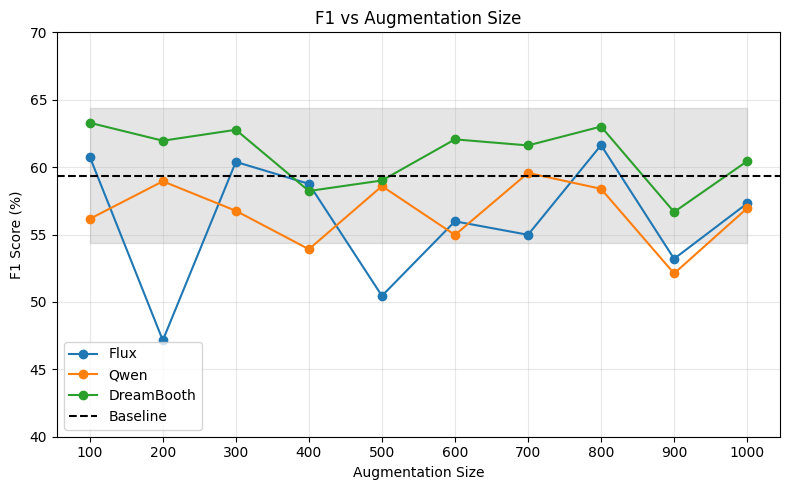

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =============================
# CONFIG
# =============================
CSV_PATH = "/data/vision/beery/scratch/serena/0424/evaluation_results_report.csv"

BASELINE_MEAN = 59.36
BASELINE_STD = 4.99

# =============================
# LOAD DATA
# =============================
df = pd.read_csv(CSV_PATH)

# =============================
# EXTRACT SIZE
# =============================
def extract_size(name):
    try:
        return int(name.split("_")[2])
    except:
        return None

df["size"] = df["Subfolder"].apply(extract_size)

# =============================
# PARSE F1 MEAN ± STD
# =============================
df[["f1_mean", "f1_std"]] = df["F1 (Mean±Std)"].str.split("±", expand=True)
df["f1_mean"] = df["f1_mean"].astype(float)
df["f1_std"] = df["f1_std"].astype(float)

# =============================
# FILTER SERIES
# =============================
def filter_range(d):
    return d[(d["size"] >= 100) & (d["size"] <= 1000)]

flux_df = filter_range(df[df["Subfolder"].str.contains("Flux")]).sort_values("size")
qwen_df = filter_range(df[df["Subfolder"].str.contains("Qwen")]).sort_values("size")
dream_df = filter_range(df[df["Subfolder"].str.contains("dreambooth")]).sort_values("size")

# =============================
# PLOT
# =============================
plt.figure(figsize=(8, 5))

# =============================
# FLUX
# =============================
plt.plot(flux_df["size"], flux_df["f1_mean"], marker="o", label="Flux")
plt.fill_between(
    flux_df["size"],
    flux_df["f1_mean"] - flux_df["f1_std"],
    flux_df["f1_mean"] + flux_df["f1_std"],
    alpha=0.2
)

# =============================
# QWEN
# =============================
plt.plot(qwen_df["size"], qwen_df["f1_mean"], marker="o", label="Qwen")
plt.fill_between(
    qwen_df["size"],
    qwen_df["f1_mean"] - qwen_df["f1_std"],
    qwen_df["f1_mean"] + qwen_df["f1_std"],
    alpha=0.2
)

# =============================
# DREAMBOOTH
# =============================
plt.plot(dream_df["size"], dream_df["f1_mean"], marker="o", label="DreamBooth")
plt.fill_between(
    dream_df["size"],
    dream_df["f1_mean"] - dream_df["f1_std"],
    dream_df["f1_mean"] + dream_df["f1_std"],
    alpha=0.2
)

# =============================
# BASELINE
# =============================
plt.axhline(
    BASELINE_MEAN,
    linestyle="--",
    color="black",
    label="Baseline"
)

plt.fill_between(
    [100, 1000],
    BASELINE_MEAN - BASELINE_STD,
    BASELINE_MEAN + BASELINE_STD,
    color="black",
    alpha=0.1
)

# =============================
# FORMATTING
# =============================
plt.ylim(40, 70)
plt.xlabel("Augmentation Size")
plt.ylabel("F1 Score (%)")
plt.title("F1 vs Augmentation Size")

plt.xticks(range(100, 1100, 100))
plt.grid(True, alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show(

## Bar chart for other methods

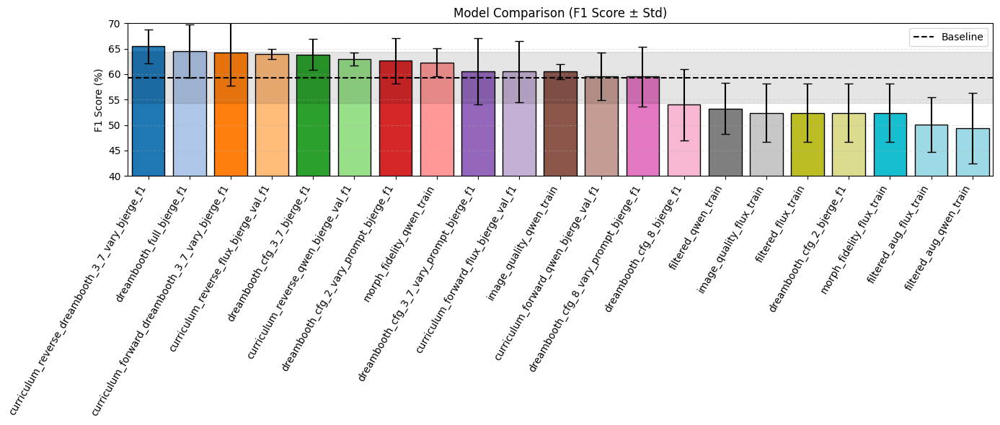

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =============================
# CONFIG
# =============================
CSV_PATH = "/data/vision/beery/scratch/serena/0424/evaluation_results_report.csv"  # <-- change if needed

BASELINE_MEAN = 59.36
BASELINE_STD = 4.99

# =============================
# LOAD DATA
# =============================
df = pd.read_csv(CSV_PATH)

# =============================
# FILTER DATA
# =============================
df = df[~df["Subfolder"].str.startswith("baseline")]
df = df[~df["Subfolder"].str.startswith("Siblings")]

# =============================
# PARSE VALUES
# =============================
df["f1_mean"] = df["F1 (Mean±Std)"].apply(lambda x: float(x.split("±")[0]))
df["f1_std"] = df["F1 (Mean±Std)"].apply(lambda x: float(x.split("±")[1]))

df = df.sort_values("f1_mean", ascending=False)

# =============================
# PLOT
# =============================
plt.figure(figsize=(14, 6))

x = np.arange(len(df))

# each bar gets a unique color
colors = plt.cm.tab20(np.linspace(0, 1, len(df)))

plt.bar(
    x,
    df["f1_mean"],
    yerr=df["f1_std"],
    capsize=4,
    color=colors,
    edgecolor="black"
)

# =============================
# FORMATTING
# =============================
plt.xticks(x, df["Subfolder"], rotation=60, ha="right")
plt.ylabel("F1 Score (%)")
plt.title("Model Comparison (F1 Score ± Std)")
plt.ylim(40, 70)

# baseline line + std band
plt.axhline(
    BASELINE_MEAN,
    linestyle="--",
    color="black",
    linewidth=1.5,
    label="Baseline"
)

plt.fill_between(
    [-1, len(df)],
    BASELINE_MEAN - BASELINE_STD,
    BASELINE_MEAN + BASELINE_STD,
    color="black",
    alpha=0.1
)

plt.xlim(-0.5, len(df) - 0.5)
plt.grid(axis="y", linestyle="--", alpha=0.3)
plt.legend()

plt.tight_layout()
plt.show()

In [8]:
import os
import torch
import numpy as np

BASE_SEARCH_DIR = "/data/vision/beery/scratch/serena/insect_analysis/organized"

subfolders = sorted([f.path for f in os.scandir(BASE_SEARCH_DIR) if f.is_dir()])

print(f"Using device: {DEVICE}")
print(f"Found {len(subfolders)} subfolders to evaluate.\n")

print(f"{'Folder':<25} {'Mean Epoch':<15} {'Std Epoch':<15} {'N':<5}")
print("-" * 65)

for folder in subfolders:
    pth_files = [f for f in os.listdir(folder) if f.endswith(".pth")]

    epochs = []

    for pth in pth_files:
        save_path = os.path.join(folder, pth)
        ckpt = torch.load(save_path, map_location="cpu")

        best_epoch = ckpt.get("best_epoch", None)

        if best_epoch is not None:
            epochs.append(best_epoch)

    if len(epochs) == 0:
        continue  # skip folders with no valid data

    mean_epoch = np.mean(epochs)
    std_epoch = np.std(epochs)
    n = len(epochs)

    print(f"{os.path.basename(folder):<25} {mean_epoch:<15.2f} {std_epoch:<15.2f} {n:<5}")

Using device: cuda
Found 17 subfolders to evaluate.

Folder                    Mean Epoch      Std Epoch       N    
-----------------------------------------------------------------
ablation_1000_flux        8.00            2.90            5    
ablation_1000_qwen        6.80            2.14            5    
ablation_1000_qwen_filtered 8.60            2.87            5    
ablation_100_flux         7.40            2.24            5    
ablation_100_qwen         9.80            1.47            5    
ablation_200_flux         7.00            3.90            5    
ablation_200_qwen         6.40            3.38            5    
ablation_500_flux         7.00            2.61            5    
ablation_500_qwen         5.00            3.74            5    
ablation_base             6.80            2.64            5    
augmented_base            6.80            2.64            5    
augmented_qwen_full       9.80            3.54            5    
baseline                  6.80            2.64 

## Ranked bar chart

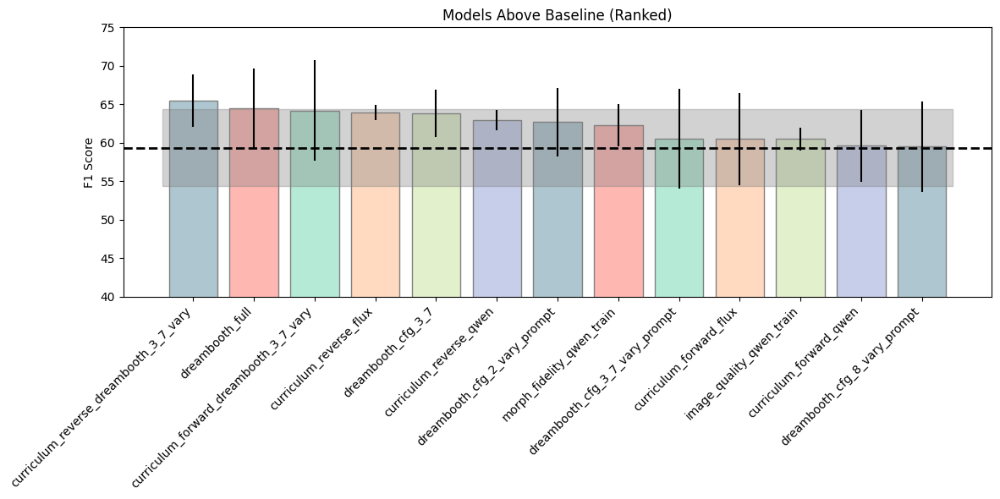

In [23]:
import numpy as np
import matplotlib.pyplot as plt

# =============================
# DATA
# =============================
data = [
    ("baseline_no_downsample_bjerge_val_f1", "43.97±3.44"),
    ("curriculum_forward_qwen_bjerge_val_f1", "59.60±4.70"),
    ("curriculum_reverse_qwen_bjerge_val_f1", "62.95±1.31"),
    ("filtered_qwen_train", "53.27±4.99"),
    ("image_quality_qwen_train", "60.50±1.46"),
    ("curriculum_forward_flux_bjerge_val_f1", "60.51±6.00"),
    ("curriculum_reverse_flux_bjerge_val_f1", "63.91±0.98"),
    ("filtered_aug_qwen_train", "49.40±6.91"),
    ("morph_fidelity_qwen_train", "62.28±2.76"),
    ("dreambooth_full_bjerge_f1", "64.53±5.17"),
    ("curriculum_forward_dreambooth_3_7_vary_bjerge_f1", "64.21±6.54"),
    ("curriculum_reverse_dreambooth_3_7_vary_bjerge_f1", "65.46±3.37"),
    ("dreambooth_cfg_8_bjerge_f1", "54.00±7.01"),
    ("dreambooth_cfg_3_7_bjerge_f1", "63.86±3.07"),
    ("dreambooth_cfg_3_7_vary_prompt_bjerge_f1", "60.54±6.48"),
    ("dreambooth_cfg_8_vary_prompt_bjerge_f1", "59.51±5.89"),
    ("dreambooth_cfg_2_bjerge_f1", "52.40±5.71"),
    ("dreambooth_cfg_2_vary_prompt_bjerge_f1", "62.68±4.46"),
    ("filtered_aug_flux_train", "50.13±5.38"),
]

# =============================
# PARSE
# =============================
labels = []
means = []
stds = []

for name, val in data:
    m, s = val.split("±")
    labels.append(name)
    means.append(float(m))
    stds.append(float(s))

means = np.array(means)
stds = np.array(stds)

# =============================
# BASELINE
# =============================
baseline_mean = 59.36
baseline_std = 4.99

# =============================
# FILTER (only above baseline)
# =============================
mask = means > baseline_mean

labels_f = [l.replace("_bjerge_val_f1", "").replace("_bjerge_f1", "") 
            for l, m in zip(labels, mask) if m]
means_f = means[mask]
stds_f = stds[mask]

# =============================
# SORT (descending)
# =============================
order = np.argsort(means_f)[::-1]

labels_f = [labels_f[i] for i in order]
means_f = means_f[order]
stds_f = stds_f[order]

# =============================
# PLOT
# =============================
plt.figure(figsize=(12, 6))

x = np.arange(len(labels_f))

# Pastel colors
pastel_colors = ["#AEC6CF", "#FFB7B2", "#B5EAD7",
                 "#FFDAC1", "#E2F0CB", "#C7CEEA"]
colors = [pastel_colors[i % len(pastel_colors)] for i in range(len(labels_f))]

plt.bar(
    x,
    means_f,
    yerr=stds_f,
    color=colors,
    edgecolor="gray"
)

# =============================
# BASELINE LINE + FULL WIDTH SHADE
# =============================
plt.axhline(
    y=baseline_mean,
    linestyle="--",
    linewidth=2,
    color="black"
)

xmin, xmax = -0.5, len(labels_f) - 0.5

plt.fill_between(
    [xmin, xmax],
    baseline_mean - baseline_std,
    baseline_mean + baseline_std,
    color="gray",
    alpha=0.35
)

# =============================
# FORMATTING
# =============================
plt.ylim(40, 75)
plt.xticks(x, labels_f, rotation=45, ha="right")
plt.ylabel("F1 Score")
plt.title("Models Above Baseline (Ranked)")

plt.tight_layout()
plt.show()

PLOT F1 SCORES VS. EPOCH (curriculum learning)

Saved to: /data/vision/beery/scratch/serena/0424/Siblings_Augmentation_0_Flux/curriculum_compare.png


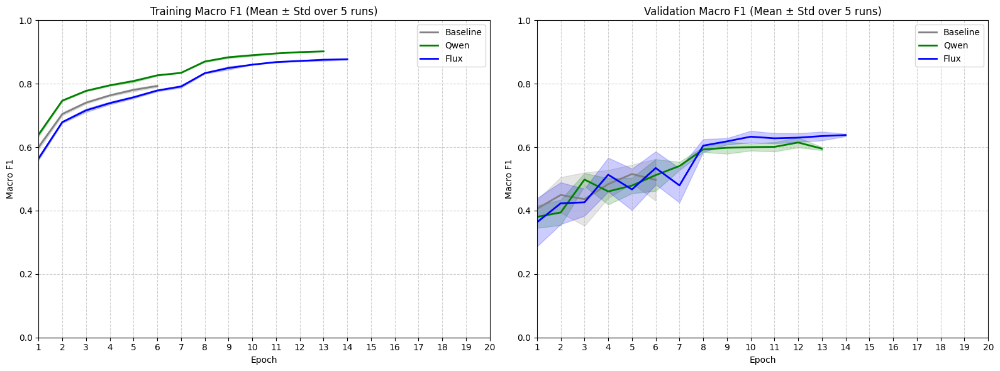

In [11]:
# =============
# CONFIGURATION
# =============
PATH_BASELINE = "/data/vision/beery/scratch/serena/0424/Siblings_Augmentation_0_Flux"

PATH_QWEN = "/data/vision/beery/scratch/serena/0424/curriculum_reverse_qwen_bjerge_val_f1"
PATH_FLUX = "/data/vision/beery/scratch/serena/0424/curriculum_reverse_flux_bjerge_val_f1"
# PATH_DREAMBOOTH = "/data/vision/beery/scratch/serena/0424/curriculum_forward_dreambooth_bjerge_val_f1"

SAVE_PATH = "/data/vision/beery/scratch/serena/0424/Siblings_Augmentation_0_Flux/curriculum_compare.png"
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# =============================
# LOAD + AGGREGATE (5 runs)
# =============================
def load_and_aggregate(directory):
    runs = []

    for i in range(1, 6):
        path = os.path.join(directory, f"history_run{i}.csv")
        if os.path.exists(path):
            runs.append(pd.read_csv(path))

    if len(runs) == 0:
        return None, None

    min_len = min(len(r) for r in runs)
    runs = [r.iloc[:min_len].reset_index(drop=True) for r in runs]

    data = np.stack([r.values for r in runs], axis=0)

    mean_df = pd.DataFrame(np.mean(data, axis=0), columns=runs[0].columns)
    std_df = pd.DataFrame(np.std(data, axis=0), columns=runs[0].columns)

    return mean_df, std_df

# =============================
# LOAD ALL METHODS
# =============================
base_mean, base_std = load_and_aggregate(PATH_BASELINE)
qwen_mean, qwen_std = load_and_aggregate(PATH_QWEN)
flux_mean, flux_std = load_and_aggregate(PATH_FLUX)
# dream_mean, dream_std = load_and_aggregate(PATH_DREAMBOOTH)

# =============================
# PLOT HELPERS
# =============================
def plot_method(ax, mean_df, std_df, column, label, color):
    epochs = np.arange(1, len(mean_df) + 1)

    ax.plot(epochs, mean_df[column], label=label, color=color, linewidth=2)
    ax.fill_between(
        epochs,
        mean_df[column] - std_df[column],
        mean_df[column] + std_df[column],
        color=color,
        alpha=0.2
    )

# =============================
# PLOT
# =============================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

colors = {
    "Baseline": "gray",
    "Qwen": "green",
    "Flux": "blue",
    "Dreambooth": "purple"
}

# =============================
# TRAIN PLOT
# =============================
epochs = np.arange(1, len(base_mean) + 1)

plot_method(ax1, base_mean, base_std, "train_f1", "Baseline", colors["Baseline"])
plot_method(ax1, qwen_mean, qwen_std, "train_f1", "Qwen", colors["Qwen"])
plot_method(ax1, flux_mean, flux_std, "train_f1", "Flux", colors["Flux"])
# plot_method(ax1, dream_mean, dream_std, "train_f1", "Dreambooth", colors["Dreambooth"])

ax1.set_title("Training Macro F1 (Mean ± Std over 5 runs)")
ax1.set_xlabel("Epoch")
ax1.set_ylabel("Macro F1")
ax1.legend()
ax1.grid(True, linestyle="--", alpha=0.6)
ax1.set_ylim(0, 1)

# =============================
# VAL PLOT
# =============================
plot_method(ax2, base_mean, base_std, "val_f1", "Baseline", colors["Baseline"])
plot_method(ax2, qwen_mean, qwen_std, "val_f1", "Qwen", colors["Qwen"])
plot_method(ax2, flux_mean, flux_std, "val_f1", "Flux", colors["Flux"])
# plot_method(ax2, dream_mean, dream_std, "val_f1", "Dreambooth", colors["Dreambooth"])

ax2.set_title("Validation Macro F1 (Mean ± Std over 5 runs)")
ax2.set_xlabel("Epoch")
ax2.set_ylabel("Macro F1")
ax2.legend()
ax2.grid(True, linestyle="--", alpha=0.6)
ax2.set_ylim(0, 1)
ax1.set_xticks(np.arange(1, 21, 1))
ax2.set_xticks(np.arange(1, 21, 1))

ax1.set_xlim(1, 20)
ax2.set_xlim(1, 20)

# =============================
# SAVE
# =============================
plt.tight_layout()
plt.savefig(SAVE_PATH)
print(f"Saved to: {SAVE_PATH}")
plt.show()

## visualize grid of images

In [ ]:
from PIL import Image

img = Image.open("/data/vision/beery/scratch/serena/diffusion/generated_full_dataset_flux/Aglais urticae/flux-Aglais urticae_seed_999.png")
img = Image.open("/data/vision/beery/scratch/serena/diffusion/generated_full_dataset_qwen_edit/Aglais urticae/qwen-edit-Aglais urticae-0000.jpg")

# Print size (width, height)
print(f"Image size: {img.size}")   # (W, H)

# If you want them separately:
width, height = img.size
print(f"Width: {width}, Height: {height}")

Image size: (1440, 736)
Width: 1440, Height: 736


Individual run comparison saved to: /data/vision/beery/scratch/serena/0424/curriculum_reverse_flux_bjerge_val_f1/baseline_compare.png


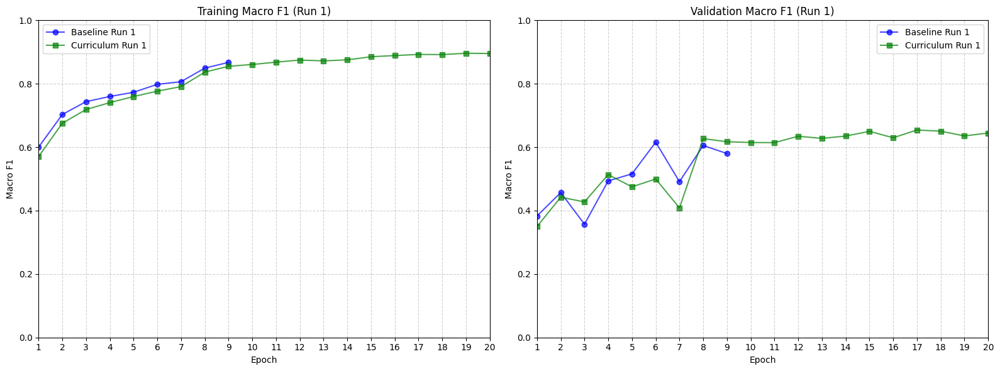

In [14]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# =============
# CONFIGURATION
# =============
# Paths to your specific run 1 files
FILE_BASELINE = "/data/vision/beery/scratch/serena/0424/Siblings_Augmentation_0_Flux/history_run1.csv"
FILE_CURRICULUM = "/data/vision/beery/scratch/serena/0424/curriculum_reverse_flux_bjerge_val_f1/history_run1.csv"

SAVE_PATH = "/data/vision/beery/scratch/serena/0424/curriculum_reverse_flux_bjerge_val_f1/baseline_compare.png"

# =================
# LOAD DATA
# =================
df_base = pd.read_csv(FILE_BASELINE)
df_curr = pd.read_csv(FILE_CURRICULUM)

# =================
# PLOTTING
# =================
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# --- Plot 1: Train F1 (Run 1 Only) ---
epochs_base = range(1, len(df_base) + 1)
epochs_curr = range(1, len(df_curr) + 1)


ax1.plot(epochs_base, df_base['train_f1'], label='Baseline Run 1', color='blue', marker='o', alpha=0.7)
ax1.plot(epochs_curr, df_curr['train_f1'], label='Curriculum Run 1', color='green', marker='s', alpha=0.7)

ax1.set_title('Training Macro F1 (Run 1)')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Macro F1')
ax1.legend()
ax1.grid(True, linestyle='--', alpha=0.6)
ax1.set_ylim(0, 1)
ax1.set_xlim(1,20)
ax1.set_xticks(np.arange(1, 21, 1))

# --- Plot 2: Val F1 (Run 1 Only) ---
ax2.plot(epochs_base, df_base['val_f1'], label='Baseline Run 1', color='blue', marker='o', alpha=0.7)
ax2.plot(epochs_curr, df_curr['val_f1'], label='Curriculum Run 1', color='green', marker='s', alpha=0.7)

ax2.set_title('Validation Macro F1 (Run 1)')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Macro F1')
ax2.legend()
ax2.set_ylim(0, 1)
ax2.grid(True, linestyle='--', alpha=0.6)
ax2.set_xlim(1,20)
ax2.set_xticks(np.arange(1, 21, 1))


plt.tight_layout()
plt.savefig(SAVE_PATH)
print(f"Individual run comparison saved to: {SAVE_PATH}")

QWEN VS FLUX F1 PLOT

Precision, recall, f1 score plots

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, models
import os
import numpy as np
from sklearn.metrics import precision_recall_fscore_support
import matplotlib.pyplot as plt

# =============================
# CONFIG
# =============================
MODELS_DIR  = "/data/vision/beery/scratch/serena/insect_analysis/organized/baseline"
TEST_DIR    = "/data/vision/beery/scratch/serena/Bjerge_dataset/test_cropped"
NUM_CLASSES = 9
BATCH_SIZE  = 32
DEVICE      = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# =============================
# DATASET & TRANSFORM
# =============================
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

test_dataset = datasets.ImageFolder(TEST_DIR, transform=test_transform)
test_loader  = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
class_names  = test_dataset.classes

# =============================
# EVALUATION LOGIC
# =============================
model_files = sorted([f for f in os.listdir(MODELS_DIR) if f.startswith("best_model_run") and f.endswith(".pth")])
assert len(model_files) == 5, f"Expected 5 models, found {len(model_files)}"

# Storage for per-class metrics: [run, class_idx]
all_precision = np.zeros((5, NUM_CLASSES))
all_recall    = np.zeros((5, NUM_CLASSES))
all_f1        = np.zeros((5, NUM_CLASSES))

for i, model_file in enumerate(model_files):
    print(f"Evaluating {model_file}...")
    model_path = os.path.join(MODELS_DIR, model_file)
    checkpoint = torch.load(model_path, map_location=DEVICE)
    state_dict = checkpoint["model_state_dict"] if "model_state_dict" in checkpoint else checkpoint

    model = models.resnet18(weights=None)
    model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
    model.load_state_dict(state_dict)
    model.to(DEVICE).eval()

    all_preds, all_labels = [], []
    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(DEVICE), labels.to(DEVICE)
            _, preds = torch.max(model(inputs), 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Get per-class metrics (average=None returns 9 values)
    p, r, f, _ = precision_recall_fscore_support(all_labels, all_preds, average=None, zero_division=0)
    all_precision[i] = p
    all_recall[i]    = r
    all_f1[i]        = f

# =============================
# PLOTTING
# =============================
metrics_data = {
    "Precision": all_precision,
    "Recall":    all_recall,
    "F1-Score":  all_f1
}

for metric_name, data in metrics_data.items():
    mean_vals = np.mean(data, axis=0)
    std_vals  = np.std(data, axis=0)
    
    plt.figure(figsize=(12, 6))
    
    # Plotting line for mean
    plt.plot(class_names, mean_vals, label=f'Mean {metric_name}', color='teal', marker='o', linewidth=2)
    
    # Shading for Standard Deviation
    plt.fill_between(class_names, 
                     mean_vals - std_vals, 
                     mean_vals + std_vals, 
                     color='teal', alpha=0.2, label='Std Dev (5 runs)')
    
    plt.title(f'Test {metric_name} per Class (Mean ± Std Across 5 Runs)')
    plt.ylabel(metric_name)
    plt.xlabel('Insect Species')
    plt.ylim(0, 1) # Keep Y-axis consistent
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    plt.tight_layout()
    
    save_name = os.path.join(MODELS_DIR, f"test_graph_{metric_name.lower().replace('-','')}.png")
    plt.savefig(save_name)
    print(f"Saved graph → {save_name}")

: 